# Clustering and Segmentation of Newyork and Toronto neighborhoods

### Problem statement:
 
#### Provide solution for investors and business owners to choose the right area in the city to start a business. Few key factors that would influence this decision are
 
#### 1.	Area of the city
#### 2.	Commonly visited places
#### 3.	Footfalls to a particular place
#### 4.	What other places are common in the area
 
 
### Specific use case: New specialty coffee shop is looking to setup a shop in New york city or Toronto city and is looking for recommendations in terms of top 2 locations in both cities to carry on further feasibility study. Our exercise is to give 2 neighborhoods in New york and Toronto with data on why they are the ideal locations to setup a coffee shop.
 
### Assumptions:
 
#### 1.	Cost of investment and rental have not been considered for this study
#### 2.	Once the location recommendation is done based on above criteria a separate feasibility study would be undertaken for the same
 
### Data requirement for the problem and Solution:
 
#### 1.	We need to get data on New york and Toronto city in terms what are the locations of neighborhoods, venues that are visited along with footfall information (Wikipedia/IBM data/Foursquare APIs)
#### 2. Clean and format the data for New york and Toronto and sample the same
#### 3.	Segment them by top venues for each neighborhood
#### 4.	Use K Means clustering to cluster the similar neighborhoods in New york and Toronto
#### 5. Determine the right K cluster value using K Elboe method
#### 6. Visualize the clustered data on Maps of NYC and Toronto
#### 7.	Analyze these clusters and provide the recommendation to the investor 


In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

import json # library to handle JSON files

import requests # library to handle requests
from bs4 import BeautifulSoup # library to parse HTML and XML documents

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

!pip install OSGridConverter

import folium # map rendering library
from geopy.geocoders import Nominatim
from OSGridConverter import grid2latlong

# import k-means from clustering stage
from sklearn.cluster import KMeans

print("Libraries imported.")

Libraries imported.


#### Four square credentials

In [3]:
CLIENT_ID = 'Y5DV33TWWVM1QZ15EDAU4EFRXXWXTSG5ASB1GPKDVEHYQRIX' # your Foursquare ID
CLIENT_SECRET = 'OJSREK0AOUPGSQXPUABGQMPFSGPB5QKU44T1AWKXEWWVEB44' # your Foursquare Secret
ACCESS_TOKEN = '' # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 30

In [4]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

## Importing NYC data from IBM

In [5]:
#download NYC dataset from IBM server
#load data 
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [6]:
#all the relevant data is located within "features"
nyc_neighborhoods_data = newyork_data['features']

In [7]:
# define the dataframe columns
column_names = ['City','Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe (creating an empty dataframe)
nyc_neighborhoods = pd.DataFrame(columns=column_names)

In [8]:
#transform data into pandas dataframe
for data in nyc_neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    city = 'New York City'
    
    nyc_neighborhoods = nyc_neighborhoods.append({'City': city, 'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [9]:
#populated dataframe with nyc data 
nyc_neighborhoods.head()

,City,Borough,Neighborhood,Latitude,Longitude
0,New York City,Bronx,Wakefield,40.894705,-73.847201
1,New York City,Bronx,Co-op City,40.874294,-73.829939
2,New York City,Bronx,Eastchester,40.887556,-73.827806
3,New York City,Bronx,Fieldston,40.895437,-73.905643
4,New York City,Bronx,Riverdale,40.890834,-73.912585


In [10]:
#merge neighborhood and borough into one column
nyc_neighborhoods['Neighborhood'] = nyc_neighborhoods['Neighborhood'] + " (" + nyc_neighborhoods['Borough'] + ")"
nyc_neighborhoods.drop(columns = 'Borough', inplace=True)
nyc_neighborhoods.head()

,City,Neighborhood,Latitude,Longitude
0,New York City,Wakefield (Bronx),40.894705,-73.847201
1,New York City,Co-op City (Bronx),40.874294,-73.829939
2,New York City,Eastchester (Bronx),40.887556,-73.827806
3,New York City,Fieldston (Bronx),40.895437,-73.905643
4,New York City,Riverdale (Bronx),40.890834,-73.912585


In [11]:
nyc_neighborhoods.head()

,City,Neighborhood,Latitude,Longitude
0,New York City,Wakefield (Bronx),40.894705,-73.847201
1,New York City,Co-op City (Bronx),40.874294,-73.829939
2,New York City,Eastchester (Bronx),40.887556,-73.827806
3,New York City,Fieldston (Bronx),40.895437,-73.905643
4,New York City,Riverdale (Bronx),40.890834,-73.912585


In [12]:
#verify the number of rows and columns
nyc_neighborhoods.shape

(306, 4)

### Getting Toronto Data

In [13]:
# send the GET request
data = requests.get('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M').text

In [14]:
# parse data from the html into a beautifulsoup object
#soup = BeautifulSoup(data, 'html.parser')
soup = BeautifulSoup(data, 'lxml')

In [15]:
# create three lists to store table data
postalCodeList = []
boroughList = []
neighborhoodList = []

In [16]:
table_contents=[]
table=soup.find('table')
for row in table.findAll('td'):
    cell = {}
    if row.span.text=='Not assigned':
        pass
    else:
        cell['PostalCode'] = row.p.text[:3]
        cell['Borough'] = (row.span.text).split('(')[0]
        cell['Neighborhood'] = (((((row.span.text).split('(')[1]).strip(')')).replace(' /',',')).replace(')',' ')).strip(' ')
        table_contents.append(cell)

# print(table_contents)
toronto_df=pd.DataFrame(table_contents)
toronto_df['Borough']=toronto_df['Borough'].replace({'Downtown TorontoStn A PO Boxes25 The Esplanade':'Downtown Toronto Stn A',
                                             'East TorontoBusiness reply mail Processing Centre969 Eastern':'East Toronto Business',
                                             'EtobicokeNorthwest':'Etobicoke Northwest','East YorkEast Toronto':'East York/East Toronto',
                                             'MississaugaCanada Post Gateway Processing Centre':'Mississauga'})

In [17]:
toronto_df.head()

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Queen's Park,Ontario Provincial Government


In [18]:
# drop cells with a borough that is Not assigned
toronto_df_dropna = toronto_df[toronto_df.Borough != "Not assigned"].reset_index(drop=True)
toronto_df_dropna.head()

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Queen's Park,Ontario Provincial Government


In [19]:
# group neighborhoods in the same borough
toronto_df_grouped = toronto_df_dropna.groupby(["PostalCode", "Borough"], as_index=False).agg(lambda x: ", ".join(x))
toronto_df_grouped.head()

,PostalCode,Borough,Neighborhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


In [20]:
# for Neighborhood="Not assigned", make the value the same as Borough
for index, row in toronto_df_grouped.iterrows():
    if row["Neighborhood"] == "Not assigned":
        row["Neighborhood"] = row["Borough"]
        
toronto_df_grouped.head()

,PostalCode,Borough,Neighborhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


In [21]:
# create a new test dataframe
column_names = ["PostalCode", "Borough", "Neighborhood"]
test_df = pd.DataFrame(columns=column_names)

test_list = ["M5G", "M2H", "M4B", "M1J", "M4G", "M4M", "M1R", "M9V", "M9L", "M5V", "M1B", "M5A"]

for postcode in test_list:
    test_df = test_df.append(toronto_df_grouped[toronto_df_grouped["PostalCode"]==postcode], ignore_index=True)
    
test_df

,PostalCode,Borough,Neighborhood
0,M5G,Downtown Toronto,Central Bay Street
1,M2H,North York,Hillcrest Village
2,M4B,East York,"Parkview Hill, Woodbine Gardens"
3,M1J,Scarborough,Scarborough Village
4,M4G,East York,Leaside
5,M4M,East Toronto,Studio District
6,M1R,Scarborough,"Wexford, Maryvale"
7,M9V,Etobicoke,"South Steeles, Silverstone, Humbergate, Jamest..."
8,M9L,North York,Humber Summit
9,M5V,Downtown Toronto,"CN Tower, King and Spadina, Railway Lands, Har..."


In [22]:
# print the number of rows of the cleaned dataframe
toronto_df_grouped.shape

(103, 3)

#### Getting Geospatial data for Toronto

In [23]:
# load the coordinates from the csv file on Coursera
coordinates = pd.read_csv("Geospatial_Coordinates.csv")
coordinates.head()

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [24]:
# rename the column "PostalCode"
coordinates.rename(columns={"Postal Code": "PostalCode"}, inplace=True)
coordinates.head()

,PostalCode,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [25]:
# merge two table on the column "PostalCode"
toronto_df_new = toronto_df_grouped.merge(coordinates, on="PostalCode", how="left")
toronto_df_new.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476


In [26]:
# create a new test dataframe
column_names = ["PostalCode", "Borough", "Neighborhood", "Latitude", "Longitude"]
test_df = pd.DataFrame(columns=column_names)

test_list = ["M5G", "M2H", "M4B", "M1J", "M4G", "M4M", "M1R", "M9V", "M9L", "M5V", "M1B", "M5A"]

for postcode in test_list:
    test_df = test_df.append(toronto_df_new[toronto_df_new["PostalCode"]==postcode], ignore_index=True)
    
test_df

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M5G,Downtown Toronto,Central Bay Street,43.657952,-79.387383
1,M2H,North York,Hillcrest Village,43.803762,-79.363452
2,M4B,East York,"Parkview Hill, Woodbine Gardens",43.706397,-79.309937
3,M1J,Scarborough,Scarborough Village,43.744734,-79.239476
4,M4G,East York,Leaside,43.709060,-79.363452
5,M4M,East Toronto,Studio District,43.659526,-79.340923
6,M1R,Scarborough,"Wexford, Maryvale",43.750072,-79.295849
7,M9V,Etobicoke,"South Steeles, Silverstone, Humbergate, Jamest...",43.739416,-79.588437
8,M9L,North York,Humber Summit,43.756303,-79.565963
9,M5V,Downtown Toronto,"CN Tower, King and Spadina, Railway Lands, Har...",43.628947,-79.394420


In [27]:
address = 'Toronto, ON'

geolocator = Nominatim(user_agent="tn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto City are 43.6534817, -79.3839347.


In [28]:
toronto_df_new.loc[0, 'Neighborhood']

'Malvern, Rouge'

In [29]:
# filter borough names that contain the word Toronto
borough_names_unique = list(toronto_df_new.Borough.unique())

borough_with_toronto_name = []

for x in borough_names_unique:
    if "toronto" in x.lower():
        borough_with_toronto_name.append(x)
        
borough_with_toronto_name

['East Toronto',
 'East York/East Toronto',
 'Central Toronto',
 'Downtown Toronto',
 'Downtown Toronto Stn A',
 'West Toronto',
 'East Toronto Business']

In [30]:
# create a new DataFrame with only boroughs that contain the word Toronto
toronto_df_new = toronto_df_new[toronto_df_new['Borough'].isin(borough_with_toronto_name)].reset_index(drop=True)
toronto_df_new['City'] = 'Toronto'
print(toronto_df_new.shape)
toronto_df_new.head()

(39, 6)


,PostalCode,Borough,Neighborhood,Latitude,Longitude,City
0,M4E,East Toronto,The Beaches,43.676357,-79.293031,Toronto
1,M4J,East York/East Toronto,The Danforth East,43.685347,-79.338106,Toronto
2,M4K,East Toronto,"The Danforth West, Riverdale",43.679557,-79.352188,Toronto
3,M4L,East Toronto,"India Bazaar, The Beaches West",43.668999,-79.315572,Toronto
4,M4M,East Toronto,Studio District,43.659526,-79.340923,Toronto


In [31]:
# create a new DataFrame with only boroughs that contain the word Toronto
toronto_df_new = toronto_df_new[toronto_df_new['Borough'].isin(borough_with_toronto_name)].reset_index(drop=True)
toronto_df_new['Neighborhood'] = toronto_df_new['Neighborhood'] + " (" + toronto_df_new['Borough'] + ")"
toronto_df_new.drop(columns = 'Borough', inplace=True)
print(toronto_df_new.shape)
toronto_df_new.head()

(39, 5)


,PostalCode,Neighborhood,Latitude,Longitude,City
0,M4E,The Beaches (East Toronto),43.676357,-79.293031,Toronto
1,M4J,The Danforth East (East York/East Toronto),43.685347,-79.338106,Toronto
2,M4K,"The Danforth West, Riverdale (East Toronto)",43.679557,-79.352188,Toronto
3,M4L,"India Bazaar, The Beaches West (East Toronto)",43.668999,-79.315572,Toronto
4,M4M,Studio District (East Toronto),43.659526,-79.340923,Toronto


### Merging NYC and Toronto data

In [32]:
#merge the NYC dataframe and London dataframe 
nyc_toronto_neighborhoods = pd.concat([nyc_neighborhoods, toronto_df_new]).reset_index(drop=True) 
nyc_toronto_neighborhoods.head()

,City,Neighborhood,Latitude,Longitude,PostalCode
0,New York City,Wakefield (Bronx),40.894705,-73.847201,NaN
1,New York City,Co-op City (Bronx),40.874294,-73.829939,NaN
2,New York City,Eastchester (Bronx),40.887556,-73.827806,NaN
3,New York City,Fieldston (Bronx),40.895437,-73.905643,NaN
4,New York City,Riverdale (Bronx),40.890834,-73.912585,NaN


In [33]:
#verify the number of rows and columns
nyc_toronto_neighborhoods.shape

(345, 5)

### Getting data from foursquare for all Latitude and longitude for Toronto and then appending the postal code, borough and Neighborhood data

In [35]:
radius=500
LIMIT = 100

venues_list=[]
#for lat, long, post in zip(toronto_df_new['Latitude'], toronto_df_new['Longitude'], toronto_df_new['PostalCode']):
for lat, lng, neighborhood in zip(nyc_toronto_neighborhoods['Latitude'], nyc_toronto_neighborhoods['Longitude'], nyc_toronto_neighborhoods['Neighborhood']):
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
         
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']


        # return only relevant information for each nearby venue
        for v in results:
            venues_list.append((
            neighborhood,
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']))

nyc_toronto_venues = pd.DataFrame(venues_list)
nyc_toronto_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']

In [36]:
print(nyc_toronto_venues.shape)
nyc_toronto_venues

(11737, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield (Bronx),40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield (Bronx),40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
2,Wakefield (Bronx),40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
3,Wakefield (Bronx),40.894705,-73.847201,Subway,40.890468,-73.849152,Sandwich Place
4,Wakefield (Bronx),40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
5,Wakefield (Bronx),40.894705,-73.847201,Cooler Runnings Jamaican Restaurant,40.898083,-73.850259,Caribbean Restaurant
6,Wakefield (Bronx),40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop
7,Wakefield (Bronx),40.894705,-73.847201,Central Deli,40.896728,-73.844387,Deli / Bodega
8,Wakefield (Bronx),40.894705,-73.847201,Koss Quick Wash,40.891281,-73.849904,Laundromat
9,Co-op City (Bronx),40.874294,-73.829939,United States Postal Service,40.876545,-73.828978,Post Office


In [37]:
nyc_toronto_venues.to_csv('nyc_toronto_venues.csv')

In [38]:
nyc_toronto_venues.groupby(["Neighborhood"]).count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Allerton (Bronx),28,28,28,28,28,28
Annadale (Staten Island),9,9,9,9,9,9
Arden Heights (Staten Island),4,4,4,4,4,4
Arlington (Staten Island),6,6,6,6,6,6
Arrochar (Staten Island),21,21,21,21,21,21
Arverne (Queens),21,21,21,21,21,21
Astoria (Queens),100,100,100,100,100,100
Astoria Heights (Queens),11,11,11,11,11,11
Auburndale (Queens),20,20,20,20,20,20


In [39]:
print('There are {} uniques categories.'.format(len(nyc_toronto_venues['Venue Category'].unique())))

There are 449 uniques categories.


In [40]:
nyc_toronto_venues['Venue Category'].unique()[:50]

array(['Dessert Shop', 'Pharmacy', 'Ice Cream Shop', 'Sandwich Place',
       'Caribbean Restaurant', 'Donut Shop', 'Deli / Bodega',
       'Laundromat', 'Post Office', 'Pizza Place', 'Fast Food Restaurant',
       'Grocery Store', 'Restaurant', 'Discount Store', 'Bus Station',
       'Park', 'Bagel Shop', 'Accessories Store', 'Diner',
       'Seafood Restaurant', 'Bowling Alley', 'Automotive Shop',
       'Food & Drink Shop', 'Metro Station', 'Convenience Store',
       'Juice Bar', 'Chinese Restaurant', 'Bus Stop', 'Plaza',
       'Wine Shop', 'River', 'Music Venue', 'Bank', 'Baseball Field',
       'Food Truck', 'Home Service', 'Gym', 'Gym / Fitness Center',
       'Playground', 'Gourmet Shop', 'Latin American Restaurant', 'Pub',
       'Beer Bar', 'Rental Car Location', 'Coffee Shop', 'Burger Joint',
       'Mexican Restaurant', 'Mattress Store', 'Warehouse Store',
       'Supplement Shop'], dtype=object)

In [41]:
# one hot encoding
nyc_toronto_onehot = pd.get_dummies(nyc_toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nyc_toronto_onehot['Neighborhood'] = nyc_toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [nyc_toronto_onehot.columns[-1]] + list(nyc_toronto_onehot.columns[:-1])
nyc_toronto_onehot = nyc_toronto_onehot[fixed_columns]

nyc_toronto_onehot.head()

,Yoga Studio,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Thea

In [42]:
nyc_toronto_onehot.shape

(11737, 449)

In [43]:
nyc_toronto_grouped = nyc_toronto_onehot.groupby('Neighborhood').mean().reset_index()
nyc_toronto_grouped.head()

,Neighborhood,Yoga Studio,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Sh

In [44]:
nyc_toronto_grouped.shape

(344, 449)

In [45]:
num_top_venues = 5

for hood in nyc_toronto_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = nyc_toronto_grouped[nyc_toronto_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton (Bronx)----
            venue  freq
0     Pizza Place  0.11
1             Spa  0.11
2   Deli / Bodega  0.07
3     Supermarket  0.07
4  Discount Store  0.07


----Annadale (Staten Island)----
                 venue  freq
0          Pizza Place  0.22
1             Pharmacy  0.11
2        Train Station  0.11
3        Deli / Bodega  0.11
4  American Restaurant  0.11


----Arden Heights (Staten Island)----
               venue  freq
0        Coffee Shop  0.25
1           Pharmacy  0.25
2        Pizza Place  0.25
3      Deli / Bodega  0.25
4  Outdoor Sculpture  0.00


----Arlington (Staten Island)----
                 venue  freq
0             Bus Stop  0.33
1         Intersection  0.17
2        Grocery Store  0.17
3  American Restaurant  0.17
4        Deli / Bodega  0.17


----Arrochar (Staten Island)----
                venue  freq
0  Italian Restaurant   0.1
1       Deli / Bodega   0.1
2         Pizza Place   0.1
3            Bus Stop   0.1
4        Liquor Store   0.1


----A

4         Park  0.14


----Castleton Corners (Staten Island)----
            venue  freq
0     Pizza Place  0.21
1  Ice Cream Shop  0.07
2      Bagel Shop  0.07
3  Sandwich Place  0.07
4   Go Kart Track  0.07


----Central Bay Street (Downtown Toronto)----
                venue  freq
0         Coffee Shop  0.17
1      Sandwich Place  0.06
2                Café  0.05
3  Italian Restaurant  0.05
4        Burger Joint  0.03


----Central Harlem (Manhattan)----
                 venue  freq
0   African Restaurant  0.07
1                  Bar  0.04
2  American Restaurant  0.04
3   Seafood Restaurant  0.04
4          Pizza Place  0.04


----Charleston (Staten Island)----
            venue  freq
0  Cosmetics Shop  0.07
1      Shoe Store  0.07
2     Coffee Shop  0.07
3   Big Box Store  0.07
4      Donut Shop  0.04


----Chelsea (Manhattan)----
         venue  freq
0  Art Gallery  0.10
1  Coffee Shop  0.05
2       Bakery  0.05
3      Theater  0.03
4    Wine Shop  0.03


----Chelsea (Staten Islan

                venue  freq
0   Hotpot Restaurant  0.09
1   Korean Restaurant  0.07
2  Chinese Restaurant  0.07
3     Bubble Tea Shop  0.04
4              Bakery  0.04


----Fordham (Bronx)----
                  venue  freq
0  Fast Food Restaurant  0.06
1     Mobile Phone Shop  0.06
2            Donut Shop  0.06
3            Shoe Store  0.05
4                  Bank  0.05


----Forest Hill North & West (Central Toronto)----
              venue  freq
0              Park  0.25
1             Trail  0.25
2  Sushi Restaurant  0.25
3     Jewelry Store  0.25
4       Yoga Studio  0.00


----Forest Hills (Queens)----
                  venue  freq
0  Gym / Fitness Center  0.08
1                   Gym  0.08
2           Yoga Studio  0.05
3                  Park  0.05
4           Pizza Place  0.05


----Forest Hills Gardens (Queens)----
           venue  freq
0         Bakery  0.11
1  Grocery Store  0.11
2     Donut Shop  0.06
3       Pharmacy  0.06
4    Pizza Place  0.06


----Fort Greene (Brooklyn


----Long Island City (Queens)----
         venue  freq
0        Hotel  0.11
1  Coffee Shop  0.09
2  Pizza Place  0.05
3         Café  0.04
4          Bar  0.04


----Longwood (Bronx)----
                  venue  freq
0                 Diner  0.12
1    Mexican Restaurant  0.12
2  Fast Food Restaurant  0.12
3         Deli / Bodega  0.12
4        Sandwich Place  0.12


----Lower East Side (Manhattan)----
                venue  freq
0  Chinese Restaurant  0.06
1         Art Gallery  0.06
2    Ramen Restaurant  0.04
3              Bakery  0.04
4             Theater  0.04


----Madison (Brooklyn)----
            venue  freq
0      Bagel Shop  0.22
1      Restaurant  0.11
2     Candy Store  0.11
3  Pilates Studio  0.11
4     Pizza Place  0.11


----Malba (Queens)----
                   venue  freq
0              Rest Area   0.5
1           Tennis Court   0.5
2            Yoga Studio   0.0
3      Other Repair Shop   0.0
4  Performing Arts Venue   0.0


----Manhattan Beach (Brooklyn)----
     

----Port Richmond (Staten Island)----
                 venue  freq
0  Rental Car Location  0.25
1                  Bar  0.25
2   Mexican Restaurant  0.25
3             Bus Stop  0.25
4          Yoga Studio  0.00


----Prince's Bay (Staten Island)----
         venue  freq
0  Pizza Place  0.22
1   Food Truck  0.11
2  Coffee Shop  0.11
3    Pet Store  0.11
4     Pharmacy  0.11


----Prospect Heights (Brooklyn)----
                venue  freq
0                 Bar  0.08
1  Mexican Restaurant  0.07
2     Thai Restaurant  0.05
3          Restaurant  0.03
4           Wine Shop  0.03


----Prospect Lefferts Gardens (Brooklyn)----
                  venue  freq
0                  Café  0.08
1           Coffee Shop  0.06
2                Bakery  0.06
3  Caribbean Restaurant  0.06
4           Pizza Place  0.06


----Prospect Park South (Brooklyn)----
                  venue  freq
0  Caribbean Restaurant  0.09
1           Pizza Place  0.07
2  Fast Food Restaurant  0.07
3         Grocery Store  0.07

4  American Restaurant  0.03


----Sunset Park (Brooklyn)----
                       venue  freq
0                     Bakery  0.08
1  Latin American Restaurant  0.08
2                Pizza Place  0.08
3         Mexican Restaurant  0.08
4                       Bank  0.08


----Sutton Place (Manhattan)----
                  venue  freq
0    Italian Restaurant  0.06
1  Gym / Fitness Center  0.04
2           Pizza Place  0.04
3   American Restaurant  0.04
4           Coffee Shop  0.04


----The Annex, North Midtown, Yorkville (Central Toronto)----
            venue  freq
0     Coffee Shop  0.15
1  Sandwich Place  0.15
2            Café  0.15
3        Pharmacy  0.05
4  History Museum  0.05


----The Beaches (East Toronto)----
               venue  freq
0                Pub  0.25
1              Trail  0.25
2  Health Food Store  0.25
3        Yoga Studio  0.00
4        Outdoor Gym  0.00


----The Danforth  East (East York/East Toronto)----
                   venue  freq
0           Intersect

In [46]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [47]:
nyc_toronto_grouped.head()

,Neighborhood,Yoga Studio,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Sh

In [48]:
#Now let's create the new dataframe and display the top 10 venues for each PostalCode
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = nyc_toronto_grouped['Neighborhood']

for ind in np.arange(nyc_toronto_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(nyc_toronto_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton (Bronx),Pizza Place,Spa,Discount Store,Supermarket,Deli / Bodega,Donut Shop,Check Cashing Service,Gas Station,Grocery Store,Pharmacy
1,Annadale (Staten Island),Pizza Place,Deli / Bodega,American Restaurant,Pharmacy,Train Station,Diner,Restaurant,Liquor Store,Farmers Market,Escape Room
2,Arden Heights (Staten Island),Pizza Place,Pharmacy,Deli / Bodega,Coffee Shop,Yemeni Restaurant,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant
3,Arlington (Staten Island),Bus Stop,Deli / Bodega,Grocery Store,Intersection,American Restaurant,Factory,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant
4,Arrochar (Staten Island),Pizza Place,Liquor Store,Bus Stop,Deli / Bodega,Italian Restaurant,Cosmetics Shop,Outdoors & Recreation,Sandwich Place,Mediterranean Restaurant,Athletics & Sports


In [49]:
neighborhoods_venues_sorted.shape

(344, 11)

In [54]:
import seaborn as sns
from scipy.spatial.distance import cdist


In [56]:
import matplotlib.pylab as plt
%matplotlib inline

## Use K Means clustering to Cluster NYC and Toronto data

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

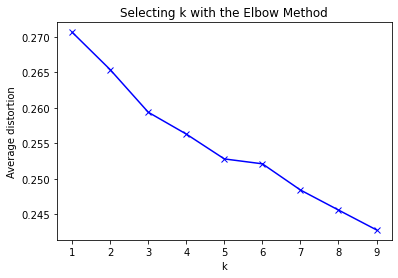

In [58]:
# Selecting K Cluster number by using the Elbow method
nyc_toronto_grouped_clustering = nyc_toronto_grouped.drop('Neighborhood', 1)
kCluster=range(1,10)
meanDistortions=[]

for k in kCluster:
      kmeans = KMeans(n_clusters=k, random_state=0).fit(nyc_toronto_grouped_clustering)
      meanDistortions.append(sum(np.min(cdist(nyc_toronto_grouped_clustering, kmeans.cluster_centers_, 'euclidean'), axis = 1)) / nyc_toronto_grouped_clustering.shape[0])

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

plt.plot(kCluster, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

In [59]:
# Setting the K value as 9 the distortion reduces significantly post 9
# set number of clusters
kclusters = 9

nyc_toronto_grouped_clustering = nyc_toronto_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(nyc_toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 1, 0, 6, 1, 2, 2, 1, 2, 1])

In [60]:
#quick visual on how the clusters are distributed
print(kmeans.labels_)

[1 1 0 6 1 2 2 1 2 1 2 2 2 2 1 2 8 1 2 1 2 0 1 1 1 2 2 0 6 2 1 3 0 2 0 7 2
 1 2 0 1 1 2 5 2 7 7 2 2 1 1 2 2 2 2 2 2 2 2 2 1 2 7 4 1 2 2 1 2 1 2 0 7 1
 2 1 7 1 1 2 2 7 1 1 2 2 2 2 1 7 2 0 1 2 2 7 1 2 1 2 1 2 1 2 2 2 7 1 2 2 2
 1 2 7 1 2 1 2 1 1 2 1 7 7 2 2 1 2 1 0 2 2 7 1 1 1 1 2 1 2 0 1 0 2 1 1 2 1
 2 2 7 1 1 2 1 2 1 2 2 2 1 2 7 1 2 1 1 1 1 7 2 2 2 2 2 1 2 1 2 2 1 2 1 2 2
 1 2 2 0 1 0 6 1 1 1 0 2 2 1 1 5 4 2 1 1 7 1 1 1 2 2 3 6 1 0 1 1 2 0 1 2 2
 1 1 2 0 1 1 7 1 2 6 2 1 2 1 1 1 1 1 2 2 6 1 2 2 7 1 1 2 4 2 2 2 1 7 1 2 1
 2 1 2 7 2 1 2 1 4 7 1 1 0 7 2 6 1 2 2 0 2 2 4 7 0 7 0 2 7 2 7 2 2 2 1 7 2
 2 2 2 1 2 2 1 2 2 2 4 2 2 4 2 2 6 0 2 2 2 1 1 2 2 2 0 0 2 7 2 2 2 7 2 1 1
 0 2 2 6 2 7 1 0 1 2 2]


In [61]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

merged = nyc_toronto_neighborhoods

merged = merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

merged.head()

,City,Neighborhood,Latitude,Longitude,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,New York City,Wakefield (Bronx),40.894705,-73.847201,NaN,7.0,Pharmacy,Dessert Shop,Deli / Bodega,Caribbean Restaurant,Sandwich Place,Laundromat,Donut Shop,Ice Cream Shop,Field,Entertainment Service
1,New York City,Co-op City (Bronx),40.874294,-73.829939,NaN,1.0,Bus Station,Fast Food Restaurant,Pharmacy,Deli / Bodega,Pizza Place,Restaurant,Discount Store,Bagel Shop,Grocery Store,Donut Shop
2,New York City,Eastchester (Bronx),40.887556,-73.827806,NaN,7.0,Caribbean Restaurant,Bus Station,Deli / Bodega,Diner,Bowling Alley,Pizza Place,Convenience Store,Metro Station,Chinese Restaurant,Donut Shop
3,New York City,Fieldston (Bronx),40.895437,-73.905643,NaN,2.0,Music Venue,Wine Shop,Plaza,Bus Station,River,Event Space,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store
4,New York City,Riverdale (Bronx),40.890834,-73.912585,NaN,2.0,Bus Station,Park,Playground,Gym,Gym / Fitness Center,Food Truck,Bank,Baseball Field,Plaza,Home Service


In [62]:
merged.shape

(345, 16)

In [63]:
merged[merged['Cluster Labels'].isnull()]

,City,Neighborhood,Latitude,Longitude,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
257,New York City,Howland Hook (Staten Island),40.638433,-74.186223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
merged.drop(merged[merged['Cluster Labels'].isnull()].index, inplace = True)

In [65]:
merged['Cluster Labels'].unique()[:50]

array([7., 1., 2., 0., 4., 5., 3., 6., 8.])

In [66]:
merged['City'] = merged['City'].replace(['New York City'],'Newyork')

In [67]:
#obtain geographic coordinates of NYC
nyc_address = 'New York City, NY'

nyc_geolocator = Nominatim(user_agent="ny_explorer")
nyc_location = nyc_geolocator.geocode(nyc_address)
nyc_latitude = nyc_location.latitude
nyc_longitude = nyc_location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(nyc_latitude, nyc_longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [68]:
# create map
map_clusters = folium.Map(location=[nyc_latitude, nyc_longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(merged['Latitude'], merged['Longitude'], merged['Neighborhood'], merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [69]:
address = 'Toronto, ON'

geolocator = Nominatim(user_agent="tn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto City are 43.6534817, -79.3839347.


In [70]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(merged['Latitude'], merged['Longitude'], merged['Neighborhood'], merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [71]:
Cluster1=merged.loc[merged['Cluster Labels'] == 0, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [72]:
Cluster1.shape

(26, 13)

In [73]:
Cluster1

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,Newyork,Woodlawn (Bronx),0.0,Pub,Deli / Bodega,Pizza Place,Playground,Food Truck,Rental Car Location,Donut Shop,Liquor Store,Park,Trail
32,Newyork,Van Nest (Bronx),0.0,Deli / Bodega,Pizza Place,Bus Station,Hookah Bar,Shop & Service,Donut Shop,Mobile Phone Shop,Furniture / Home Store,Coffee Shop,Playground
72,Newyork,East New York (Brooklyn),0.0,Fast Food Restaurant,Deli / Bodega,Event Service,Asian Restaurant,Caribbean Restaurant,Pharmacy,Fried Chicken Joint,Pizza Place,Metro Station,Plaza
83,Newyork,Marine Park (Brooklyn),0.0,Gym,Athletics & Sports,Pizza Place,Basketball Court,Deli / Bodega,Chinese Restaurant,Baseball Field,Park,English Restaurant,Event Service
89,Newyork,Ocean Hill (Brooklyn),0.0,Deli / Bodega,Fried Chicken Joint,Southern / Soul Food Restaurant,Bakery,Ice Cream Shop,Coffee Shop,Food,Convenience Store,Supermarket,Mexican Restaurant
144,Newyork,Glendale (Queens),0.0,Food & Drink Shop,Brewery,Arts & Crafts Store,Bus Station,Deli / Bodega,Pizza Place,Intersection,Fish Market,Flower Shop,Eastern European Restaurant
148,Newyork,South Ozone Park (Queens),0.0,Park,Deli / Bodega,Bar,Fast Food Restaurant,Sandwich Place,Food Truck,Donut Shop,Grocery Store,Hotel,Entertainment Service
150,Newyork,Whitestone (Queens),0.0,Candy Store,Bubble Tea Shop,Dance Studio,Deli / Bodega,Factory,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant
159,Newyork,Briarwood (Queens),0.0,Playground,Gym,Arts & Crafts Store,Coffee Shop,Deli / Bodega,Bus Station,Convenience Store,Indian Restaurant,Eastern European Restaurant,Electronics Store
171,Newyork,Broad Channel (Queens),0.0,Deli / Bodega,Pizza Place,Dive Bar,Sporting Goods Shop,Other Nightlife,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant


In [74]:
Cluster2=merged.loc[merged['Cluster Labels'] == 1, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [75]:
Cluster2.shape

(113, 13)

In [76]:
Cluster2

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Newyork,Co-op City (Bronx),1.0,Bus Station,Fast Food Restaurant,Pharmacy,Deli / Bodega,Pizza Place,Restaurant,Discount Store,Bagel Shop,Grocery Store,Donut Shop
5,Newyork,Kingsbridge (Bronx),1.0,Pizza Place,Sandwich Place,Latin American Restaurant,Mexican Restaurant,Bakery,Bar,Fast Food Restaurant,Donut Shop,Deli / Bodega,Burger Joint
6,Newyork,Marble Hill (Manhattan),1.0,Gym,Sandwich Place,Coffee Shop,Yoga Studio,Deli / Bodega,Supplement Shop,Steakhouse,Seafood Restaurant,Pizza Place,Department Store
8,Newyork,Norwood (Bronx),1.0,Pizza Place,Park,Chinese Restaurant,Pharmacy,Bank,Bus Station,Coffee Shop,Liquor Store,Fish & Chips Shop,Sandwich Place
10,Newyork,Baychester (Bronx),1.0,Bank,Donut Shop,Arcade,Electronics Store,Mattress Store,Sandwich Place,Shopping Mall,Gym / Fitness Center,Men's Store,Mexican Restaurant
11,Newyork,Pelham Parkway (Bronx),1.0,Italian Restaurant,Pizza Place,Frozen Yogurt Shop,Gourmet Shop,Coffee Shop,Donut Shop,Café,Gas Station,Sandwich Place,Performing Arts Venue
13,Newyork,Bedford Park (Bronx),1.0,Chinese Restaurant,Diner,Mexican Restaurant,Pizza Place,Deli / Bodega,Fried Chicken Joint,Sandwich Place,Food Truck,Grocery Store,Park
14,Newyork,University Heights (Bronx),1.0,Fast Food Restaurant,Fried Chicken Joint,Pizza Place,Convenience Store,Deli / Bodega,Supermarket,Burrito Place,Shoe Store,Bank,Bakery
15,Newyork,Morris Heights (Bronx),1.0,Grocery Store,Spanish Restaurant,Bank,Pharmacy,Bus Station,Park,Pizza Place,Deli / Bodega,Recreation Center,Farm
16,Newyork,Fordham (Bronx),1.0,Mobile Phone Shop,Donut Shop,Fast Food Restaurant,Bank,Shoe Store,Pharmacy,Spanish Restaurant,Supplement Shop,Gym / Fitness Center,Clothing Store


In [77]:
Cluster3=merged.loc[merged['Cluster Labels'] == 2, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [78]:
Cluster3.shape

(152, 13)

In [79]:
Cluster3

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,Newyork,Fieldston (Bronx),2.0,Music Venue,Wine Shop,Plaza,Bus Station,River,Event Space,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store
4,Newyork,Riverdale (Bronx),2.0,Bus Station,Park,Playground,Gym,Gym / Fitness Center,Food Truck,Bank,Baseball Field,Plaza,Home Service
9,Newyork,Williamsbridge (Bronx),2.0,Soup Place,Nightclub,Bar,Restaurant,Yemeni Restaurant,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant
12,Newyork,City Island (Bronx),2.0,Deli / Bodega,Boat or Ferry,Seafood Restaurant,Thrift / Vintage Store,Cosmetics Shop,Café,Grocery Store,Harbor / Marina,Smoke Shop,Diner
22,Newyork,Port Morris (Bronx),2.0,Furniture / Home Store,Storage Facility,Restaurant,Brewery,Spanish Restaurant,Baseball Field,Grocery Store,Peruvian Restaurant,Latin American Restaurant,Distillery
28,Newyork,Throgs Neck (Bronx),2.0,Liquor Store,American Restaurant,Sports Bar,Coffee Shop,Bar,Asian Restaurant,Mobile Phone Shop,Italian Restaurant,Pizza Place,Deli / Bodega
35,Newyork,Spuyten Duyvil (Bronx),2.0,Park,Bank,Grocery Store,Thai Restaurant,Intersection,Scenic Lookout,Pharmacy,Tennis Stadium,Tennis Court,Eastern European Restaurant
46,Newyork,Bay Ridge (Brooklyn),2.0,Spa,Italian Restaurant,Greek Restaurant,Pizza Place,Bagel Shop,American Restaurant,Bar,Middle Eastern Restaurant,Playground,Café
49,Newyork,Greenpoint (Brooklyn),2.0,Bar,Pizza Place,Coffee Shop,Cocktail Bar,Yoga Studio,Record Shop,Grocery Store,French Restaurant,Nail Salon,Bakery
51,Newyork,Brighton Beach (Brooklyn),2.0,Russian Restaurant,Restaurant,Mobile Phone Shop,Beach,Bank,Donut Shop,Gourmet Shop,Sushi Restaurant,Pharmacy,Eastern European Restaurant


In [80]:
Cluster4=merged.loc[merged['Cluster Labels'] == 3, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [81]:
Cluster4.shape

(2, 13)

In [82]:
Cluster4

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
172,Newyork,Breezy Point (Queens),3.0,Beach,Trail,Monument / Landmark,Bus Stop,Factory,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service
179,Newyork,Neponsit (Queens),3.0,Beach,Yemeni Restaurant,Factory,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room


In [83]:
Cluster5=merged.loc[merged['Cluster Labels'] == 4, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [84]:
Cluster5.shape

(7, 13)

In [85]:
Cluster5

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
27,Newyork,Clason Point (Bronx),4.0,Park,Convenience Store,Playground,Boat or Ferry,Spa,South American Restaurant,Bus Stop,Scenic Lookout,Grocery Store,Pool
192,Newyork,Somerville (Queens),4.0,Park,Surf Spot,Yemeni Restaurant,Exhibit,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service
203,Newyork,Todt Hill (Staten Island),4.0,Park,Yemeni Restaurant,Indie Theater,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service
256,Newyork,Randall Manor (Staten Island),4.0,Park,Pizza Place,Bus Stop,Playground,Yemeni Restaurant,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant
307,Toronto,The Danforth East (East York/East Toronto),4.0,Convenience Store,Park,Intersection,Exhibit,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service
315,Toronto,"Moore Park, Summerhill East (Central Toronto)",4.0,Park,Tennis Court,Playground,Yemeni Restaurant,Event Space,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant
317,Toronto,Rosedale (Downtown Toronto),4.0,Park,Trail,Playground,Yemeni Restaurant,Event Space,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant


In [97]:
Cluster6=merged.loc[merged['Cluster Labels'] == 5, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [98]:
Cluster6.shape

(2, 13)

In [99]:
Cluster6

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
76,Newyork,Mill Island (Brooklyn),5.0,Pool,Yemeni Restaurant,Exhibit,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service
238,Newyork,Butler Manor (Staten Island),5.0,Pool,Baseball Field,Gas Station,Yemeni Restaurant,Exhibit,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant


In [100]:
Cluster7=merged.loc[merged['Cluster Labels'] == 6, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [101]:
Cluster7.shape

(9, 13)

In [102]:
Cluster7

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
198,Newyork,New Brighton (Staten Island),6.0,Bus Stop,Park,Playground,Greek Restaurant,Discount Store,Deli / Bodega,Construction & Landscaping,Bowling Alley,Field,Fish Market
205,Newyork,Port Richmond (Staten Island),6.0,Rental Car Location,Bar,Bus Stop,Mexican Restaurant,Yemeni Restaurant,Exhibit,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant
206,Newyork,Mariner's Harbor (Staten Island),6.0,Deli / Bodega,Bus Stop,Supermarket,Italian Restaurant,Factory,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service
217,Newyork,Tottenville (Staten Island),6.0,Bus Stop,Thrift / Vintage Store,Cosmetics Shop,Deli / Bodega,Mexican Restaurant,Italian Restaurant,Yemeni Restaurant,Event Service,Ethiopian Restaurant,Entertainment Service
224,Newyork,Park Hill (Staten Island),6.0,Bus Stop,Coffee Shop,Athletics & Sports,Hotel,Gym / Fitness Center,Exhibit,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant
227,Newyork,Arlington (Staten Island),6.0,Bus Stop,Deli / Bodega,Grocery Store,Intersection,American Restaurant,Factory,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant
245,Newyork,Bloomfield (Staten Island),6.0,Burger Joint,Theme Park,Recreation Center,Bus Stop,Exhibit,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant
285,Newyork,Willowbrook (Staten Island),6.0,Bus Stop,Pizza Place,Intersection,Chinese Restaurant,Deli / Bodega,Factory,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant
286,Newyork,Sandy Ground (Staten Island),6.0,Bus Stop,Racetrack,Fish & Chips Shop,Athletics & Sports,Art Gallery,Playground,Historic Site,Intersection,Food Truck,Greek Restaurant


In [103]:
Cluster8=merged.loc[merged['Cluster Labels'] == 7, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [104]:
Cluster8.shape

(32, 13)

In [105]:
Cluster8

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Newyork,Wakefield (Bronx),7.0,Pharmacy,Dessert Shop,Deli / Bodega,Caribbean Restaurant,Sandwich Place,Laundromat,Donut Shop,Ice Cream Shop,Field,Entertainment Service
2,Newyork,Eastchester (Bronx),7.0,Caribbean Restaurant,Bus Station,Deli / Bodega,Diner,Bowling Alley,Pizza Place,Convenience Store,Metro Station,Chinese Restaurant,Donut Shop
18,Newyork,West Farms (Bronx),7.0,Bus Station,Park,Outdoors & Recreation,Lounge,Basketball Court,Tattoo Parlor,Gym,Sandwich Place,Chinese Restaurant,Donut Shop
25,Newyork,Morrisania (Bronx),7.0,Discount Store,Donut Shop,Bus Station,Fast Food Restaurant,Grocery Store,Ice Cream Shop,Pizza Place,Latin American Restaurant,Chinese Restaurant,Sandwich Place
26,Newyork,Soundview (Bronx),7.0,Chinese Restaurant,Discount Store,Playground,Pharmacy,Bus Station,Latin American Restaurant,Basketball Court,Burger Joint,Video Store,Bus Stop
29,Newyork,Country Club (Bronx),7.0,Sandwich Place,Chinese Restaurant,Playground,Yemeni Restaurant,Event Space,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant
41,Newyork,Olinville (Bronx),7.0,Caribbean Restaurant,Liquor Store,Supermarket,Basketball Court,Deli / Bodega,Bakery,Food,Convenience Store,Electronics Store,Empanada Restaurant
43,Newyork,Concourse (Bronx),7.0,Deli / Bodega,Grocery Store,Bakery,Chinese Restaurant,Bus Station,Italian Restaurant,Donut Shop,Clothing Store,Pharmacy,Art Museum
56,Newyork,East Flatbush (Brooklyn),7.0,Chinese Restaurant,Print Shop,Department Store,Moving Target,Supermarket,Fast Food Restaurant,Liquor Store,Park,Pharmacy,Caribbean Restaurant
73,Newyork,Starrett City (Brooklyn),7.0,Bus Station,Donut Shop,Pizza Place,Shopping Mall,Chinese Restaurant,Pharmacy,Bus Stop,American Restaurant,River,Caribbean Restaurant


In [106]:
Cluster9=merged.loc[merged['Cluster Labels'] == 8, merged.columns[[0] + [1] + list(range(5, merged.shape[1]))]]

In [107]:
Cluster9.shape

(1, 13)

In [108]:
Cluster9

,City,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
303,Newyork,Bayswater (Queens),8.0,Playground,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room


#### Observation , we observe that Cluster 3 is the main cluster with most number of common neighborhoods compared to all other neighborhoods
#### we also observe that it is the Cluster with maximum no.of entries for Coffee Shops, Cafe as "1st Most Common Venue"
#### Hence we are going to further analyze Cluster 3 specific to Coffee shop, cafe and get a list of most prefered Neighborhoods in NYC and Toronto which are both similar and have a good market for Coffee shops

In [116]:
Cluster3_grouby=Cluster3.groupby(['1st Most Common Venue','City']).count()

In [133]:
Cluster3['1st Most Common Venue'].value_counts()

Coffee Shop                   27
Italian Restaurant            16
Bar                           15
Café                          11
Park                          10
Hotel                          4
Clothing Store                 4
Grocery Store                  3
Mexican Restaurant             3
Deli / Bodega                  3
Cosmetics Shop                 3
Korean Restaurant              2
Chinese Restaurant             2
Beach                          2
Art Gallery                    2
Cocktail Bar                   2
Bakery                         2
Burger Joint                   2
Middle Eastern Restaurant      1
Pizza Place                    1
Gym / Fitness Center           1
Liquor Store                   1
Surf Spot                      1
Baseball Stadium               1
Latin American Restaurant      1
Auto Workshop                  1
Rental Car Location            1
Auto Garage                    1
Pub                            1
Big Box Store                  1
Hotpot Res

In [145]:
# create a Coffee and Cafe dataframe
column_names = ["City", "Neighborhood", "1st Most Common Venue", "2nd Most Common Venue"]
Pref_Coffee_df = pd.DataFrame(columns=column_names)

test_list = ["Coffee Shop", "Café"]

for venue in test_list:
    Pref_Coffee_df = Pref_Coffee_df.append(Cluster3[Cluster3["1st Most Common Venue"]==venue], ignore_index=True)

    
#for venue in test_list:
#    Pref_Coffee_df = Pref_Coffee_df.append(Cluster3[Cluster3["2nd Most Common Venue"]==venue], ignore_index=True)
    
Pref_Coffee_df.shape

(38, 13)

In [147]:
Pref_Coffee_df

,City,Neighborhood,1st Most Common Venue,2nd Most Common Venue,Cluster Labels,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Newyork,Cobble Hill (Brooklyn),Coffee Shop,Cocktail Bar,2.0,Playground,Yoga Studio,Italian Restaurant,Bakery,Bar,Pizza Place,Deli / Bodega,French Restaurant
1,Newyork,Park Slope (Brooklyn),Coffee Shop,Pizza Place,2.0,Burger Joint,Italian Restaurant,Bagel Shop,Japanese Restaurant,Bookstore,Spa,Pub,Bakery
2,Newyork,North Side (Brooklyn),Coffee Shop,Pizza Place,2.0,Yoga Studio,Bakery,Wine Bar,Jewelry Store,American Restaurant,Vegetarian / Vegan Restaurant,Cocktail Bar,Bookstore
3,Newyork,Manhattanville (Manhattan),Coffee Shop,Deli / Bodega,2.0,Italian Restaurant,Bar,Chinese Restaurant,Liquor Store,Mexican Restaurant,Seafood Restaurant,Sushi Restaurant,Gastropub
4,Newyork,Roosevelt Island (Manhattan),Coffee Shop,Park,2.0,Residential Building (Apartment / Condo),Supermarket,Gym / Fitness Center,Gym,Athletics & Sports,Metro Station,Greek Restaurant,Farmers Market
5,Newyork,Murray Hill (Manhattan),Coffee Shop,Hotel,2.0,Sandwich Place,Japanese Restaurant,American Restaurant,Bar,Pizza Place,Sushi Restaurant,Taco Place,Gym / Fitness Center
6,Newyork,Manhattan Valley (Manhattan),Coffee Shop,Bar,2.0,Mexican Restaurant,Thai Restaurant,Playground,Pizza Place,Indian Restaurant,Vietnamese Restaurant,Yoga Studio,Farmers Market
7,Newyork,Morningside Heights (Manhattan),Coffee Shop,Bookstore,2.0,American Restaurant,Park,Café,Deli / Bodega,Sandwich Place,Burger Joint,Mexican Restaurant,Grocery Store
8,Newyork,Financial District (Manhattan),Coffee Shop,Pizza Place,2.0,American Restaurant,Italian Restaurant,Gym / Fitness Center,Cocktail Bar,Falafel Restaurant,Hotel,Donut Shop,Gourmet Shop
9,Newyork,West Brighton (Staten Island),Coffee Shop,Italian Restaurant,2.0,Bank,Bar,Music Store,Breakfast Spot,Fast Food Restaurant,Smoke Shop,Bus Stop,Board Shop


In [148]:
Pref_Coffee_df['City'].value_counts()

Toronto    20
Newyork    18
Name: City, dtype: int64

In [149]:
Pref_Coffee_df.to_csv('nyc_toronto_coffee_venues.csv')

### Final observation and recommendation: 
#### Post analysis and Clustering for similar neighborhoods in NYC and Toronto
#### Which also have a high market for Coffee shops and Cafe footfalls
#### We are sending out the following neighborhood recommendations to the investors

#### S.No	City	Neighborhood
#### 1	Newyork	Cobble Hill (Brooklyn)
#### 2	Newyork	Park Slope (Brooklyn)
#### 3	Newyork	North Side (Brooklyn)
#### 4	Newyork	Manhattanville (Manhattan)
#### 5	Newyork	Roosevelt Island (Manhattan)
#### 6	Newyork	Murray Hill (Manhattan)
#### 7	Newyork	Manhattan Valley (Manhattan)
#### 8	Newyork	Morningside Heights (Manhattan)
#### 9	Newyork	Financial District (Manhattan)
#### 10	Newyork	West Brighton (Staten Island)
#### 11	Newyork	Sunnyside (Staten Island)
#### 12	Newyork	Carnegie Hill (Manhattan)
#### 13	Newyork	Civic Center (Manhattan)
#### 14	Toronto	Studio District (East Toronto)
#### 15	Toronto	Summerhill West, Rathnelly, South Hill, Forest Hill SE, Deer Park (Central Toronto)
#### 16	Toronto	St. James Town, Cabbagetown (Downtown Toronto)
#### 17	Toronto	Church and Wellesley (Downtown Toronto)
#### 18	Toronto	Regent Park, Harbourfront (Downtown Toronto)
#### 19	Toronto	Garden District, Ryerson (Downtown Toronto)
#### 20	Toronto	Central Bay Street (Downtown Toronto)
#### 21	Toronto	Richmond, Adelaide, King (Downtown Toronto)
#### 22	Toronto	Harbourfront East, Union Station, Toronto Islands (Downtown Toronto)
#### 23	Toronto	Toronto Dominion Centre, Design Exchange (Downtown Toronto)
#### 24	Toronto	Commerce Court, Victoria Hotel (Downtown Toronto)
#### 25	Toronto	Enclave of M5E (Downtown Toronto Stn A)
#### 26	Toronto	First Canadian Place, Underground city (Downtown Toronto)
#### 27	Toronto	Runnymede, Swansea (West Toronto)
#### 28	Newyork	Manhattan Beach (Brooklyn)
#### 29	Newyork	Prospect Lefferts Gardens (Brooklyn)
#### 30	Newyork	Washington Heights (Manhattan)
#### 31	Newyork	Hunters Point (Queens)
#### 32	Newyork	Lighthouse Hill (Staten Island)
#### 33	Toronto	St. James Town (Downtown Toronto)
#### 34	Toronto	The Annex, North Midtown, Yorkville (Central Toronto)
#### 35	Toronto	University of Toronto, Harbord (Downtown Toronto)
#### 36	Toronto	Kensington Market, Chinatown, Grange Park (Downtown Toronto)
#### 37	Toronto	Brockton, Parkdale Village, Exhibition Place (West Toronto)
#### 38	Toronto	High Park, The Junction South (West Toronto)
